In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'tensorflow-great-barrier-reef:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-competitions-data%2Fkaggle-v2%2F31703%2F2871752%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240607%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240607T063028Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D4ef7213a2c307282c5c1707873664f750cd1f489482f8d8fdc2093ba9b0f2bd984c4cd6c6a3a3c1371e458520a798abe2c954ac5494dc5c6378f46ae085d3baf570b5456f278b6d20a50c20fb5acd804c11189dd3a1663b3e316a67f54d79fae2fadccf07c9cff92bd850261564a655df89c863dbb480004bad9b1542e2e394751e96b2e05eea61c4fbc8fbf3a168e1362d44ce29c6b179364958e6dc48c1a2504aa3b2fda86fe10cc5dcbaf097bae769b49583ef2050e9a0ded6c33f67f6e4dd14755ada0212cadfb2bde8ecea0de0ecfab1c3fe5ca532e4f51198a49812ac335d65be4d545fd14db4c46bc70a1627252c32d13b4314a11ab5d9ae05ad6071a'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


In [ ]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.6/779.6 kB 36.9 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.5.0
    Uninstalling Pillow-9.5.0:
      Successfully uninstalled Pillow-9.5.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
spopt 0.6.0 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
ydata-profiling 4.6.4 requires numpy<1.26,>=1.16.0, but you have numpy 1.26.4 which is incompatible.


In [ ]:
import pandas as pd
import os
import shutil
from sklearn.model_selection import train_test_split
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm
import torch
from PIL import Image
from torchvision.transforms import functional as F
from utils.general import non_max_suppression
from models.experimental import attempt_load
import matplotlib.pyplot as plt
from IPython.display import Image, display

In [ ]:
train_csv_path = '/kaggle/input/tensorflow-great-barrier-reef/train.csv'
test_csv_path = '/kaggle/input/tensorflow-great-barrier-reef/test.csv'
train_images_path = '/kaggle/input/tensorflow-great-barrier-reef/train_images'
dataset_path = '/kaggle/working/dataset'
image_folder = os.path.join(dataset_path, 'images')
label_folder = os.path.join(dataset_path, 'labels')

In [ ]:
os.makedirs(os.path.join(image_folder, 'train'), exist_ok=True)
os.makedirs(os.path.join(image_folder, 'val'), exist_ok=True)
os.makedirs(os.path.join(image_folder, 'test'), exist_ok=True)
os.makedirs(os.path.join(label_folder, 'train'), exist_ok=True)
os.makedirs(os.path.join(label_folder, 'val'), exist_ok=True)
os.makedirs(os.path.join(label_folder, 'test'), exist_ok=True)

In [ ]:
train_df = pd.read_csv(train_csv_path)
test_df = pd.read_csv(test_csv_path)

In [ ]:
train_df = train_df[train_df['annotations'] != '[]']

In [ ]:
print(train_df[['video_id', 'video_frame', 'annotations']].head(10))


    video_id  video_frame                                        annotations
16         0           16  [{'x': 559, 'y': 213, 'width': 50, 'height': 32}]
17         0           17  [{'x': 558, 'y': 213, 'width': 50, 'height': 32}]
18         0           18  [{'x': 557, 'y': 213, 'width': 50, 'height': 32}]
19         0           19  [{'x': 556, 'y': 214, 'width': 50, 'height': 32}]
20         0           20  [{'x': 555, 'y': 214, 'width': 50, 'height': 32}]
21         0           21  [{'x': 550, 'y': 214, 'width': 50, 'height': 32}]
22         0           22  [{'x': 538, 'y': 209, 'width': 56, 'height': 47}]
23         0           23  [{'x': 535, 'y': 207, 'width': 58, 'height': 48}]
24         0           24  [{'x': 532, 'y': 205, 'width': 59, 'height': 49}]
25         0           25  [{'x': 529, 'y': 200, 'width': 61, 'height': 50}]


In [ ]:
def convert_to_yolo(x, y, w, h, img_width, img_height):
    x_center = (x + w / 2) / img_width
    y_center = (y + h / 2) / img_height
    w = w / img_width
    h = h / img_height
    return x_center, y_center, w, h

In [ ]:
train_set, val_set = train_test_split(train_df, test_size=0.2, random_state=42)

In [ ]:
def process_row(row, img_folder, lbl_folder, img_width=1280, img_height=720):
    img_path = os.path.join(train_images_path, f'video_{row["video_id"]}', f'{row["video_frame"]}.jpg')
    annotations = eval(row['annotations'])

    if os.path.exists(img_path):
        shutil.copy(img_path, img_folder)

        label_file_path = os.path.join(lbl_folder, f'{os.path.splitext(os.path.basename(img_path))[0]}.txt')

        with open(label_file_path, 'w') as f:
            for ann in annotations:
                if all(k in ann for k in ['x', 'y', 'width', 'height']):
                    x, y, w, h = convert_to_yolo(ann['x'], ann['y'], ann['width'], ann['height'], img_width, img_height)
                    f.write(f"0 {x} {y} {w} {h}\n")

In [ ]:
train_df.columns

Index(['video_id', 'sequence', 'video_frame', 'sequence_frame', 'image_id',
       'annotations'],
      dtype='object')

In [ ]:
def process_dataset(df, img_folder, lbl_folder):
    with ThreadPoolExecutor(max_workers=8) as executor:
        futures = [executor.submit(process_row, row, img_folder, lbl_folder) for _, row in df.iterrows()]
        for _ in tqdm(as_completed(futures), total=len(futures)):
            pass


In [ ]:
process_dataset(train_set, os.path.join(image_folder, 'train'), os.path.join(label_folder, 'train'))
process_dataset(val_set, os.path.join(image_folder, 'val'), os.path.join(label_folder, 'val'))
process_dataset(test_df, os.path.join(image_folder, 'test'), os.path.join(label_folder, 'test'))

100%|██████████| 3/3 [00:00<00:00, 14479.76it/s]


In [ ]:
#checking file
label_dir = os.path.join(label_folder, 'train')
label_files = os.listdir(label_dir)
for label_file in label_files[:5]:
    with open(os.path.join(label_dir, label_file), 'r') as f:
        print(f"Contents of {label_file}:")
        print(f.read())

Contents of 5827.txt:
0 0.774609375 0.41388888888888886 0.05234375 0.07222222222222222
0 0.926171875 0.5131944444444444 0.06171875 0.09861111111111111
0 0.19765625 0.8388888888888889 0.05625 0.08333333333333333
0 0.5875 0.009722222222222222 0.0390625 0.019444444444444445
0 0.176953125 0.7881944444444444 0.06953125 0.10694444444444444
0 0.3734375 0.5979166666666667 0.0484375 0.09305555555555556
0 0.09609375 0.7847222222222222 0.05 0.06666666666666667
0 0.29375 0.85625 0.0453125 0.0875
0 0.311328125 0.6048611111111111 0.02421875 0.043055555555555555

Contents of 4165.txt:
0 0.31171875 0.7701388888888889 0.0203125 0.034722222222222224
0 0.51328125 0.3576388888888889 0.0296875 0.059722222222222225
0 0.562109375 0.46805555555555556 0.03203125 0.05555555555555555
0 0.25078125 0.36180555555555555 0.0234375 0.034722222222222224
0 0.610546875 0.5534722222222223 0.04921875 0.09305555555555556
0 0.23828125 0.4736111111111111 0.0421875 0.05277777777777778
0 0.628515625 0.5166666666666667 0.0242187

In [ ]:
# Create dataset.yaml file
dataset_yaml = f"""
train: {os.path.join(image_folder, 'train')}
val: {os.path.join(image_folder, 'val')}
test: {os.path.join(image_folder, 'test')}
nc: 1
names: ['COTS']
"""
with open(os.path.join(dataset_path, 'dataset.yaml'), 'w') as f:
    f.write(dataset_yaml)

In [ ]:
!python train.py --img 640 --batch 16 --epochs 10 --data {os.path.join(dataset_path, 'dataset.yaml')} --weights yolov5s.pt

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-06-07 05:30:47.337908: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-07 05:30:47.338019: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-07 05:30:47.473933: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train:

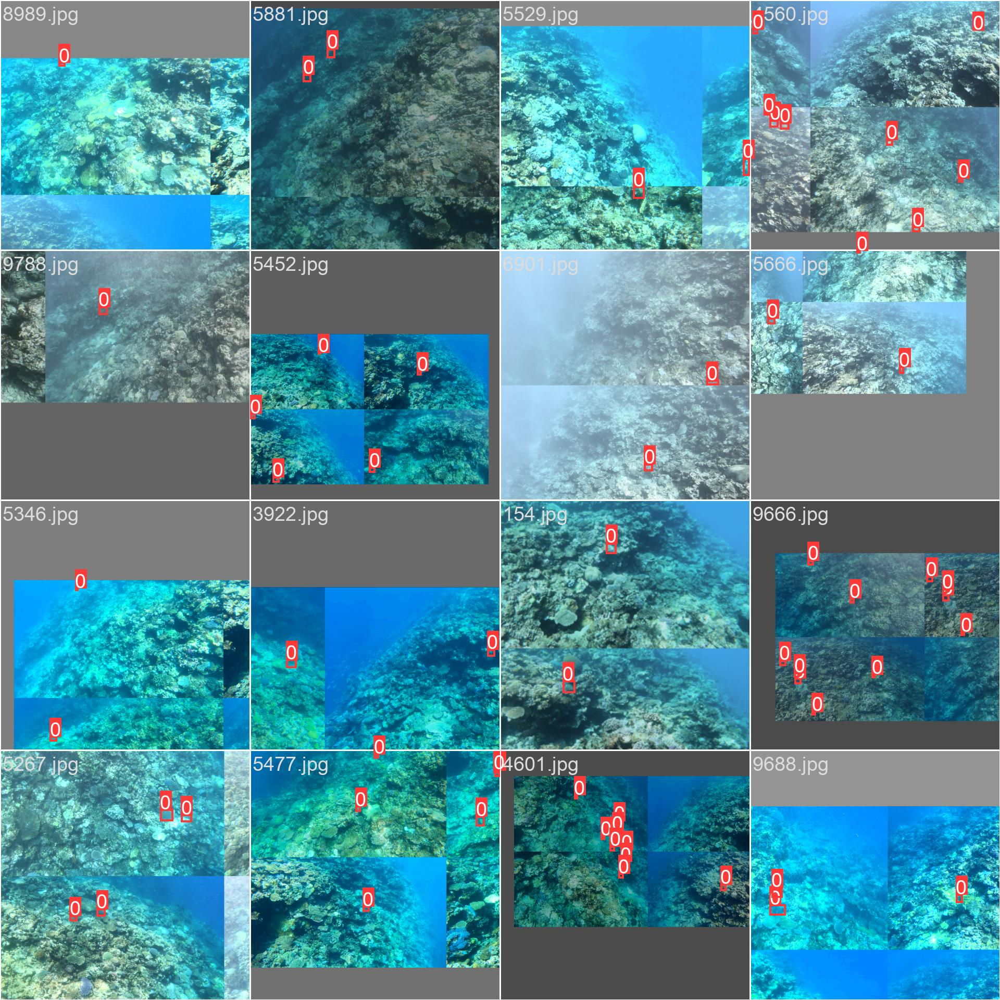

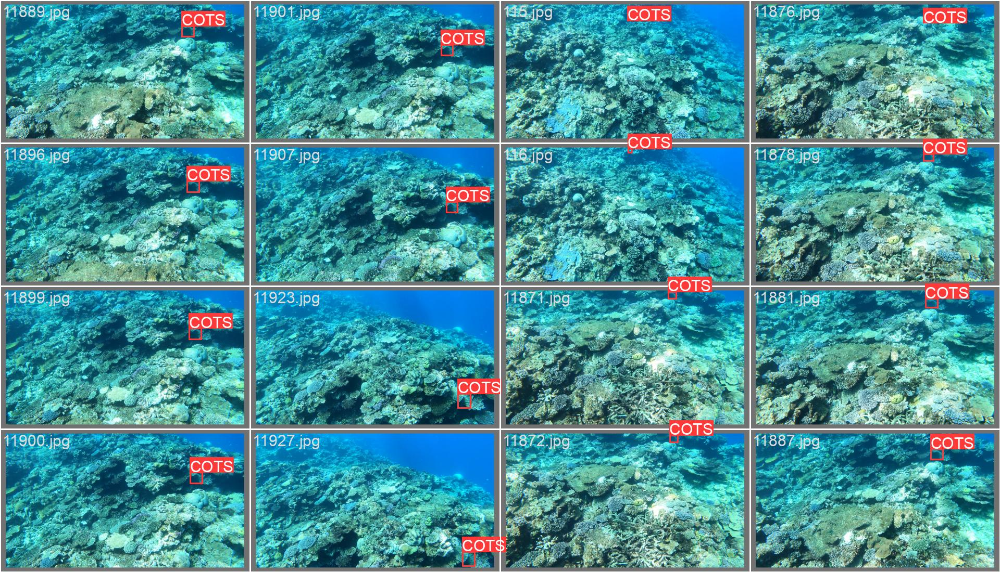

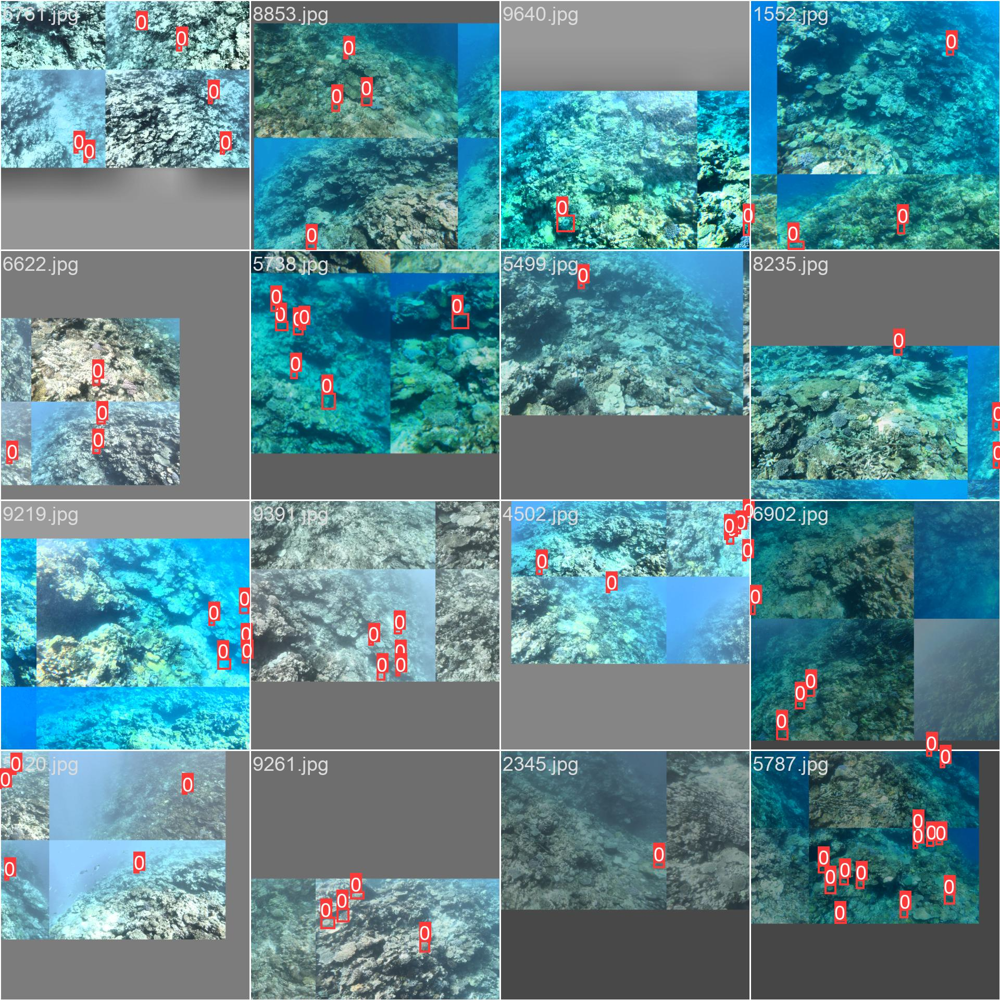

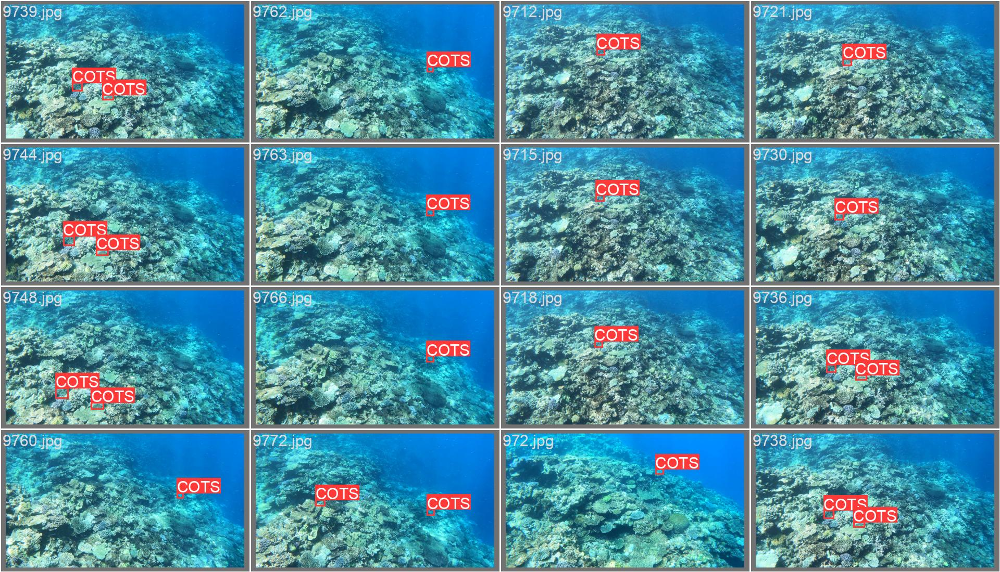

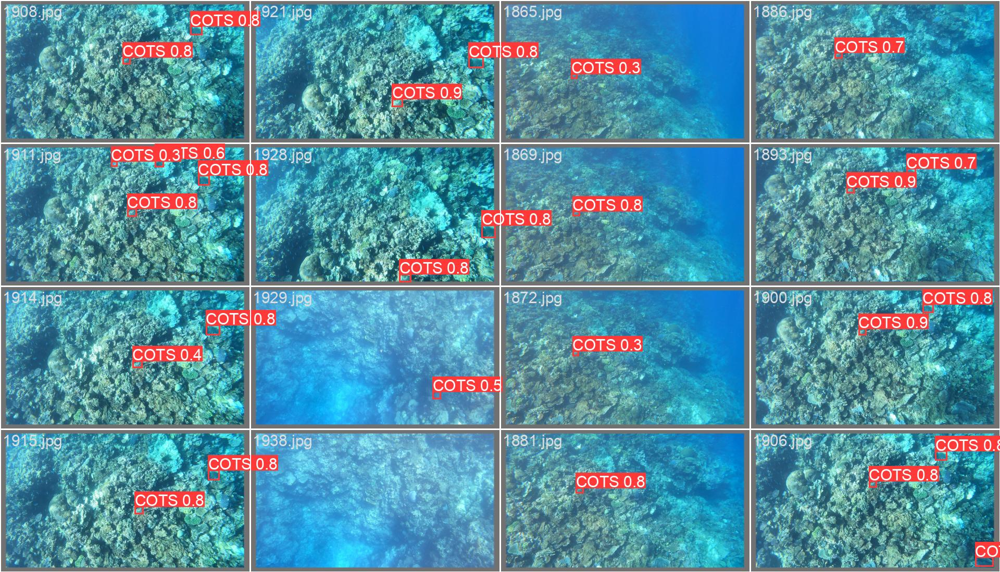

...

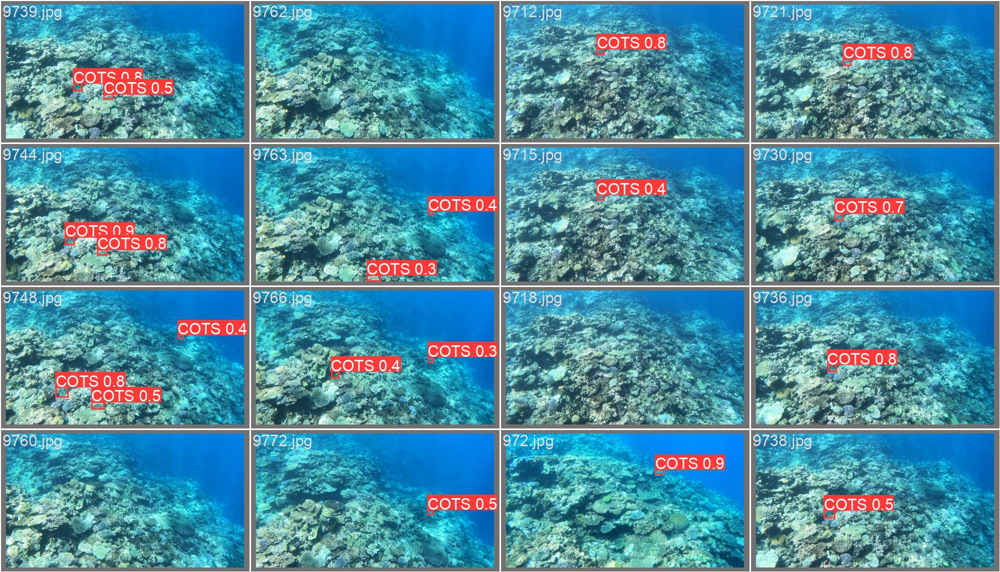

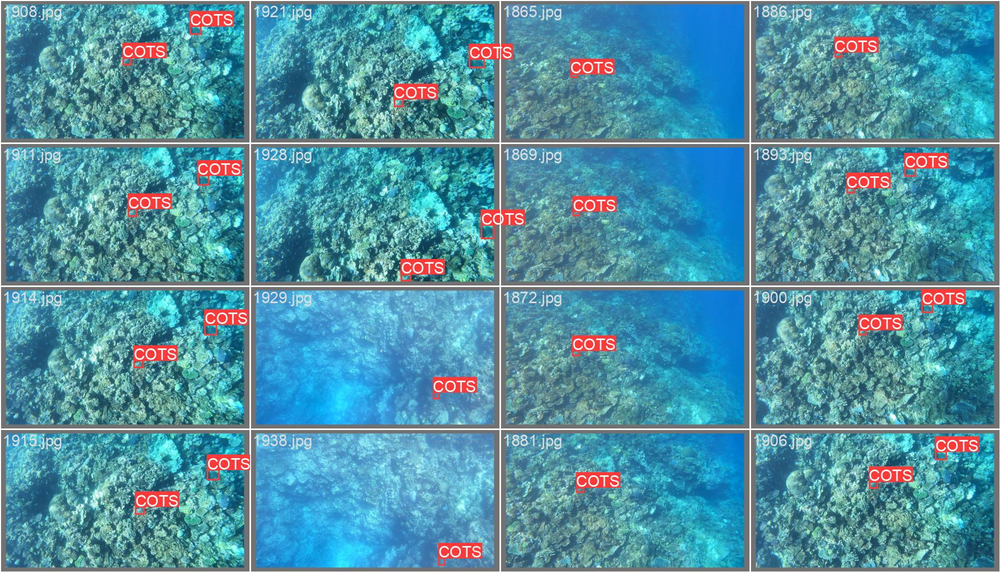

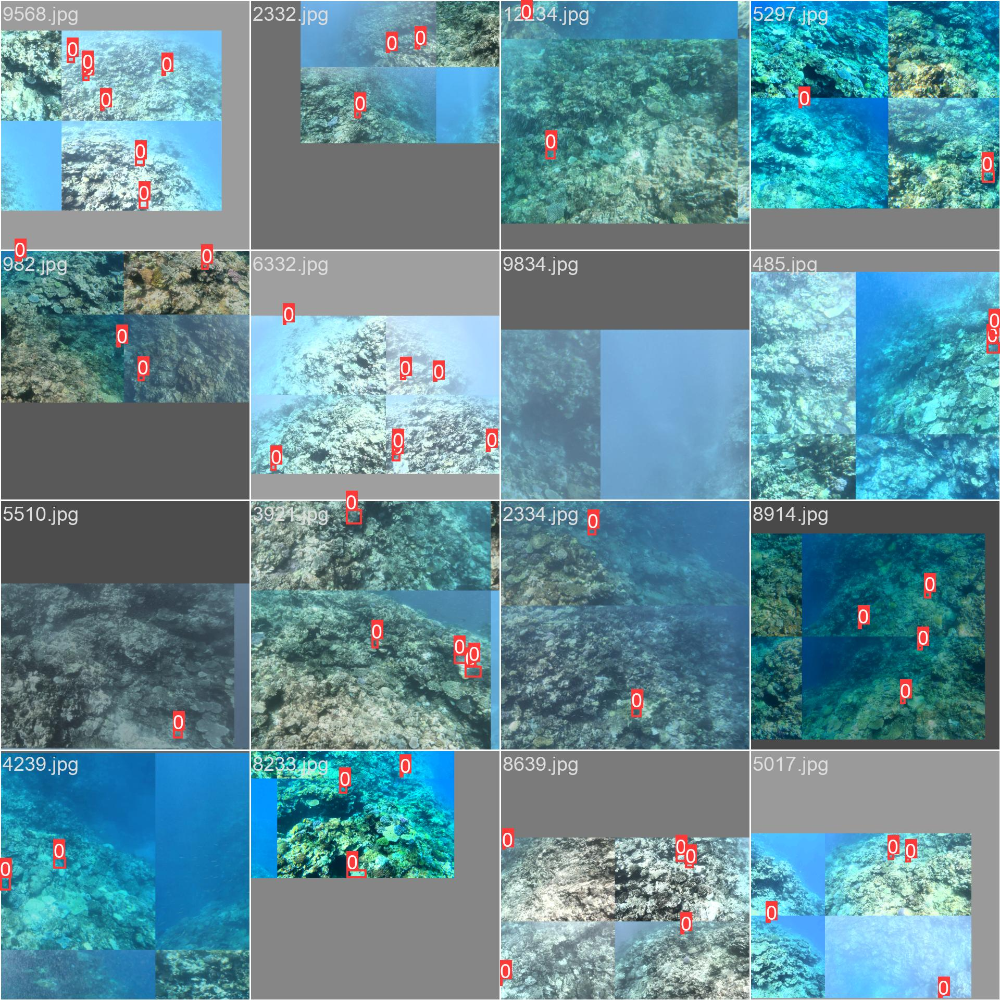

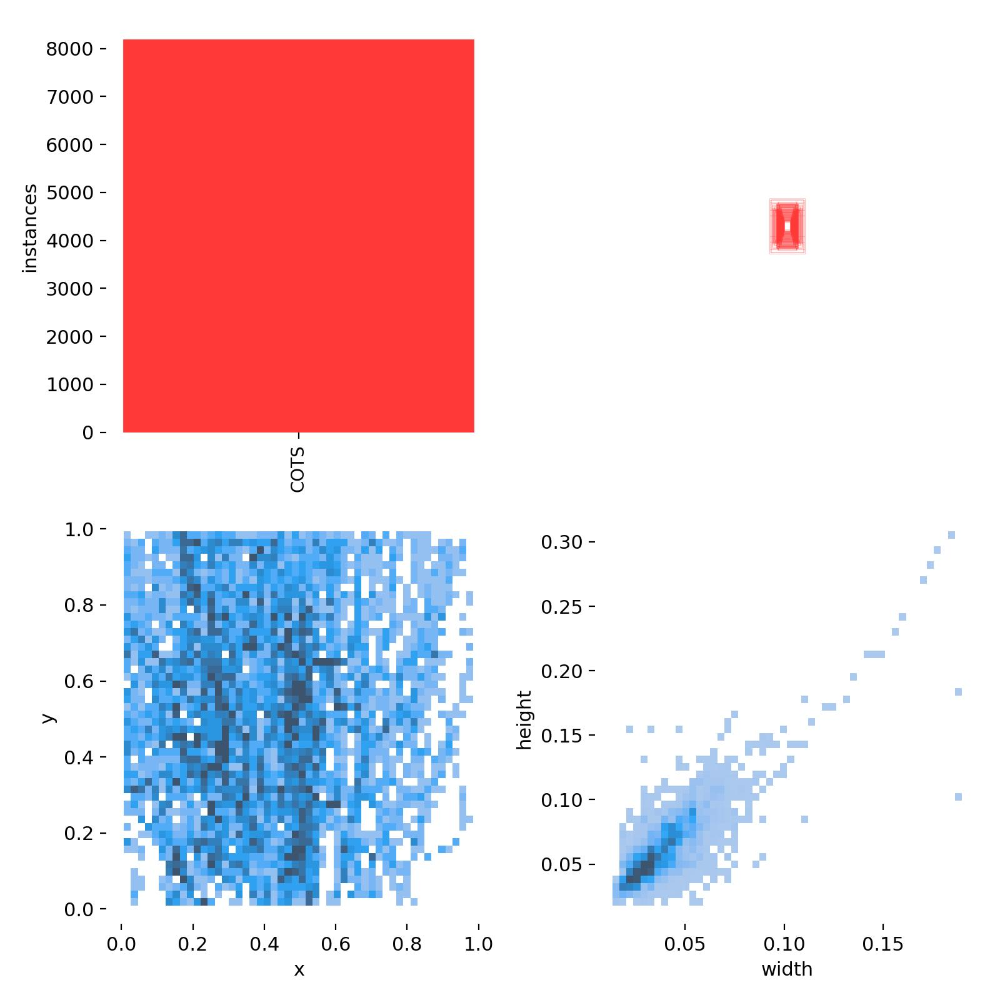

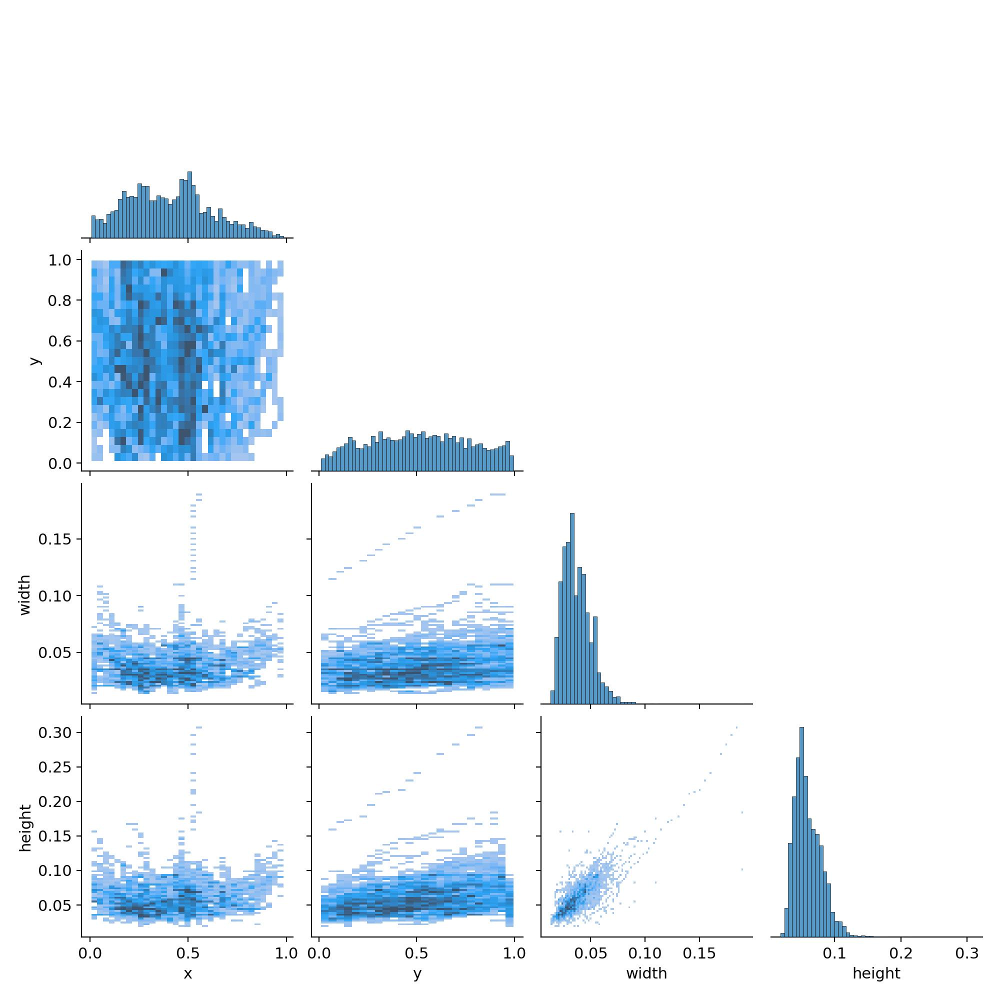

In [ ]:
results_dir = 'runs/train/exp'

for cont in os.listdir(results_dir):
    if cont.endswith('.jpg'):
        display(Image(filename=os.path.join(results_dir, cont)))

**Optimization**

In [ ]:
#epoch upgrade to 20 and batch upgrade to 64
!python train.py --img 640 --batch 64 --epochs 20 --data {os.path.join(dataset_path, 'dataset.yaml')} --weights yolov5s.pt

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-06-07 05:54:29.831861: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-07 05:54:29.831934: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-07 05:54:29.833527: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: W&B disabled due to login timeout.
train:

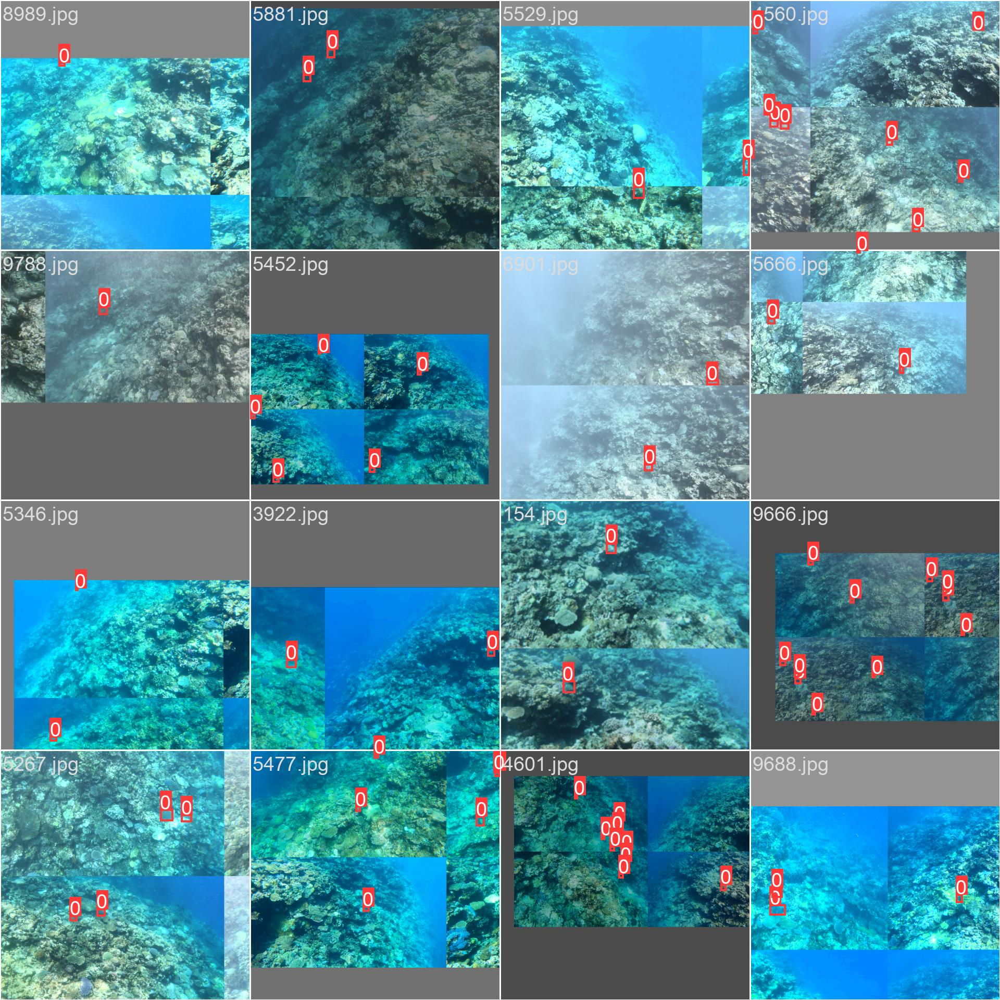

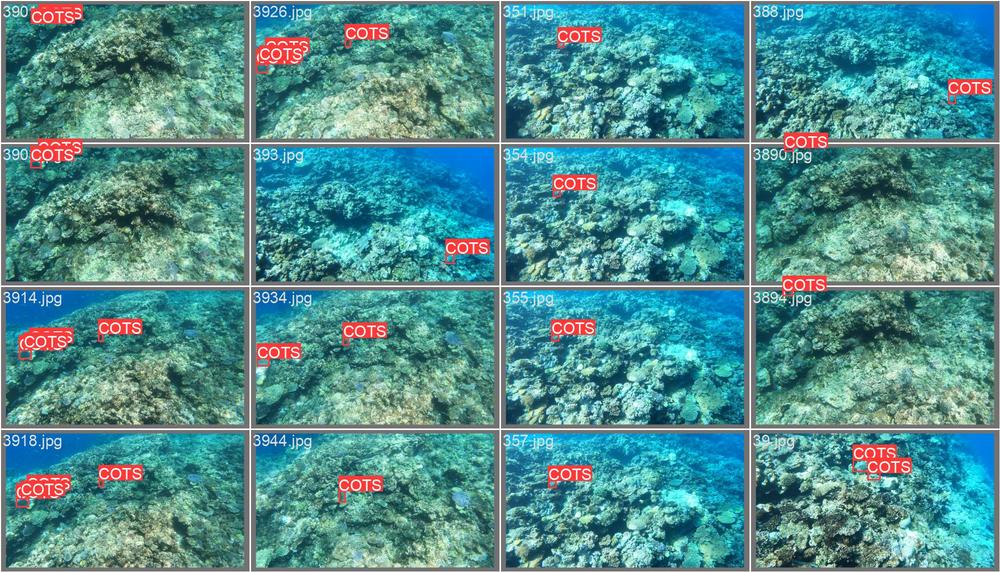

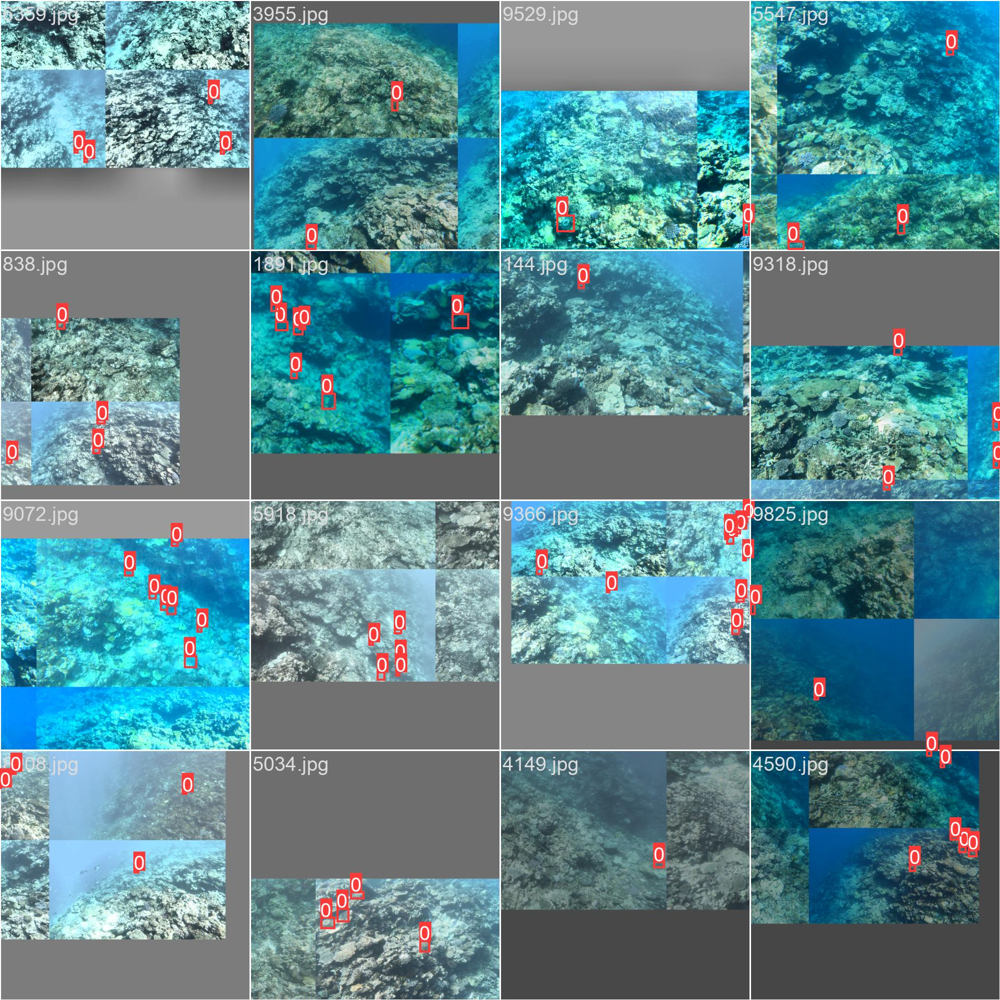

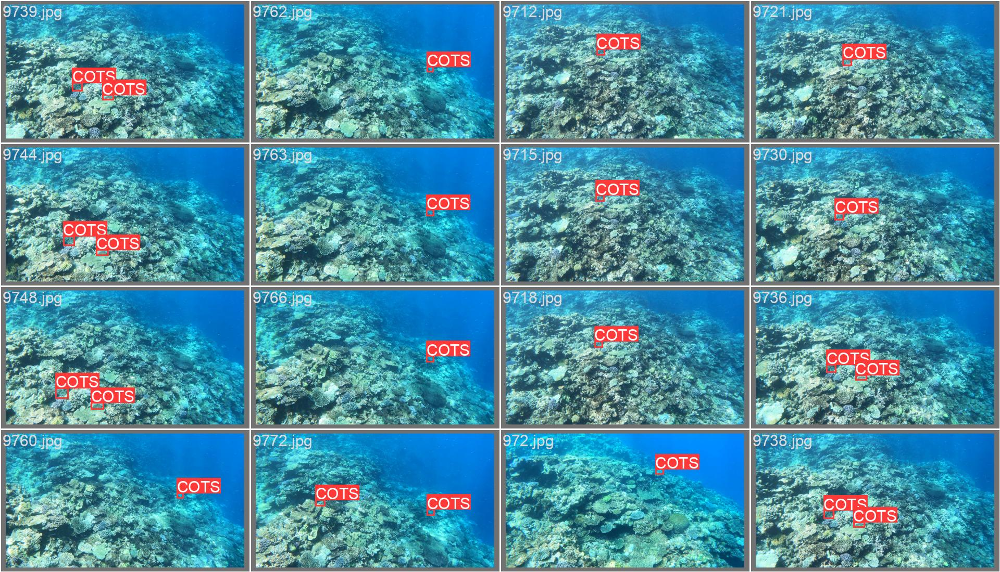

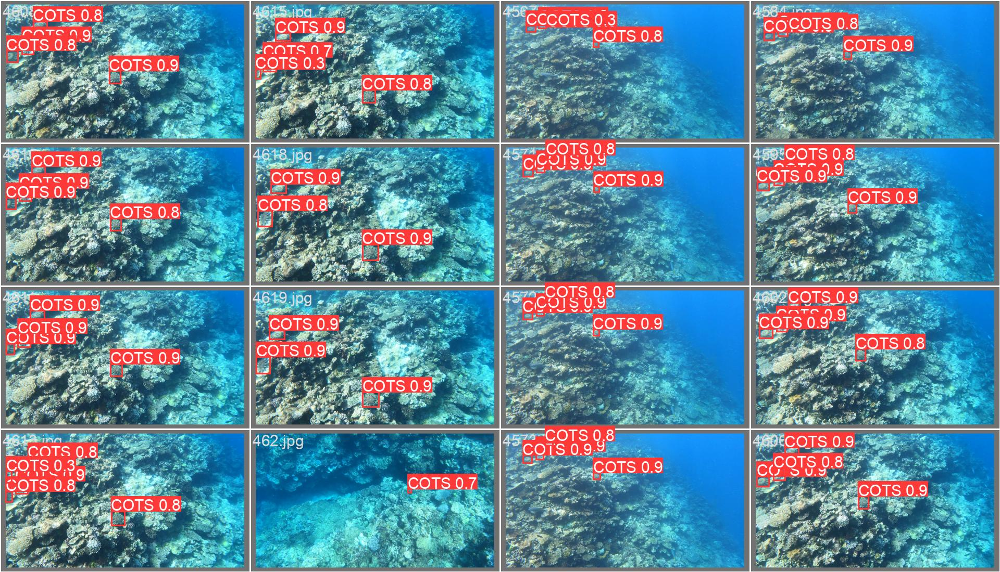

...

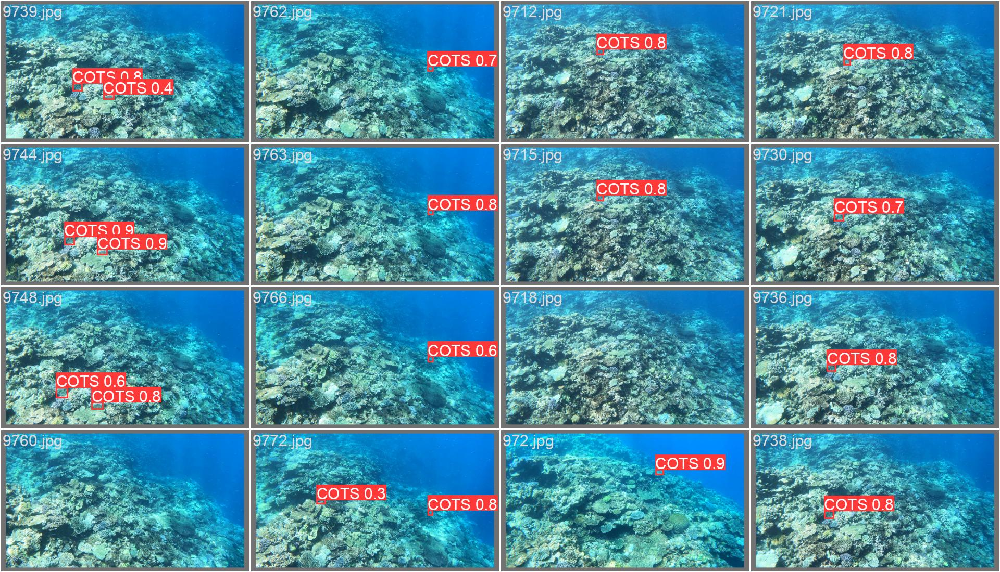

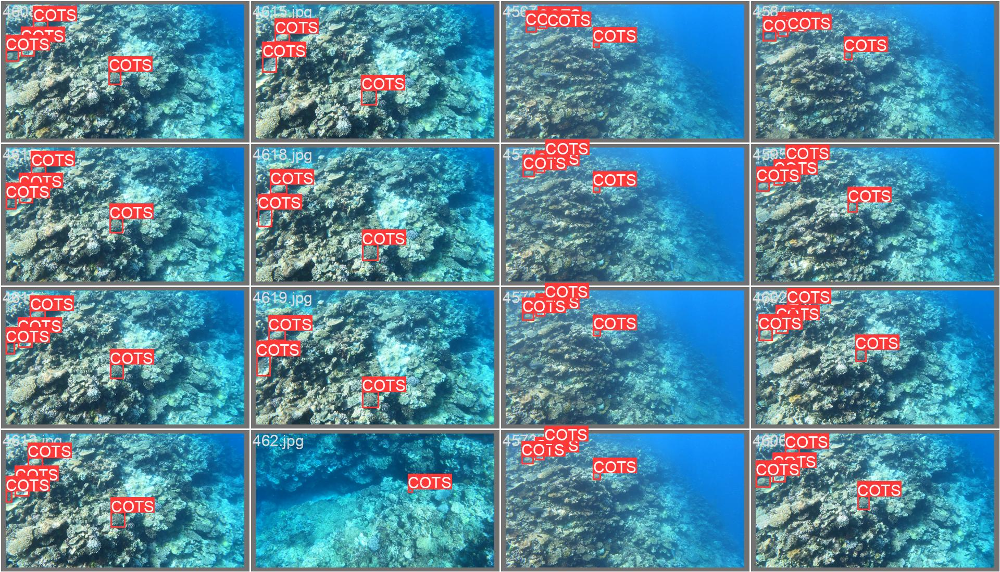

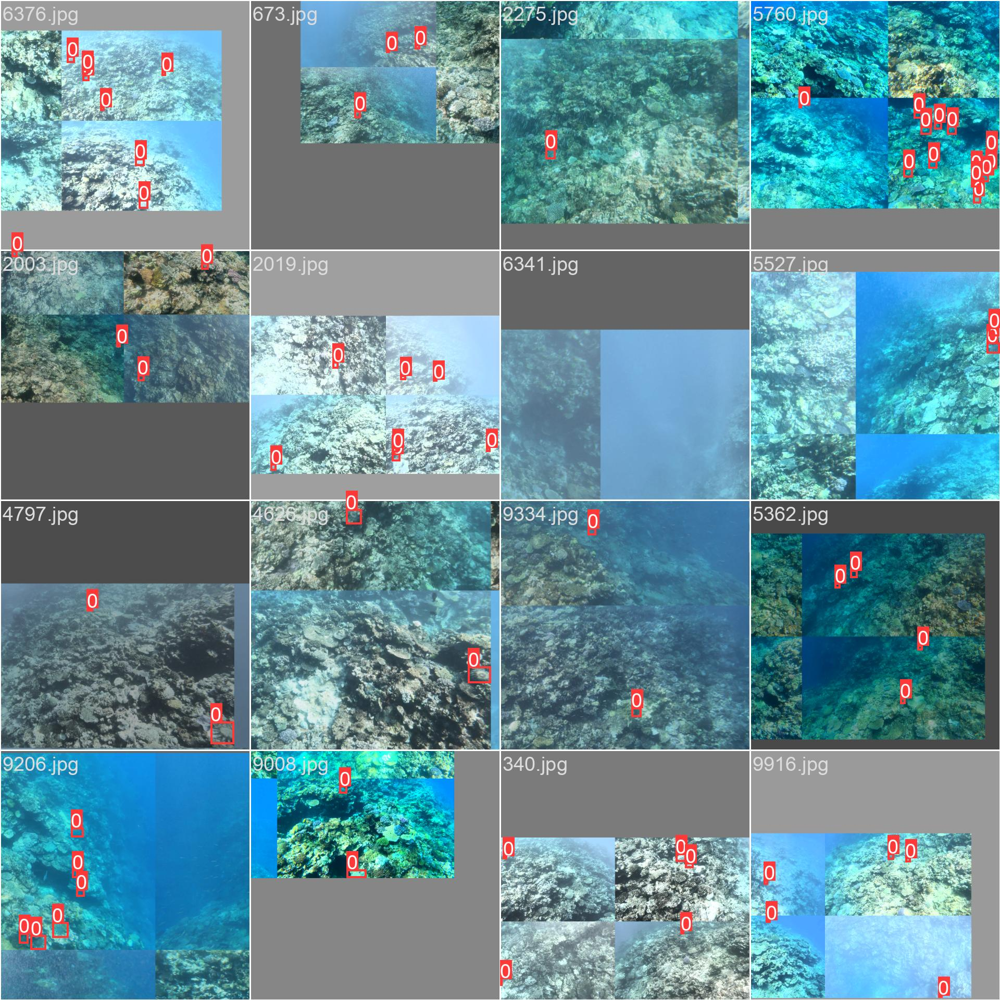

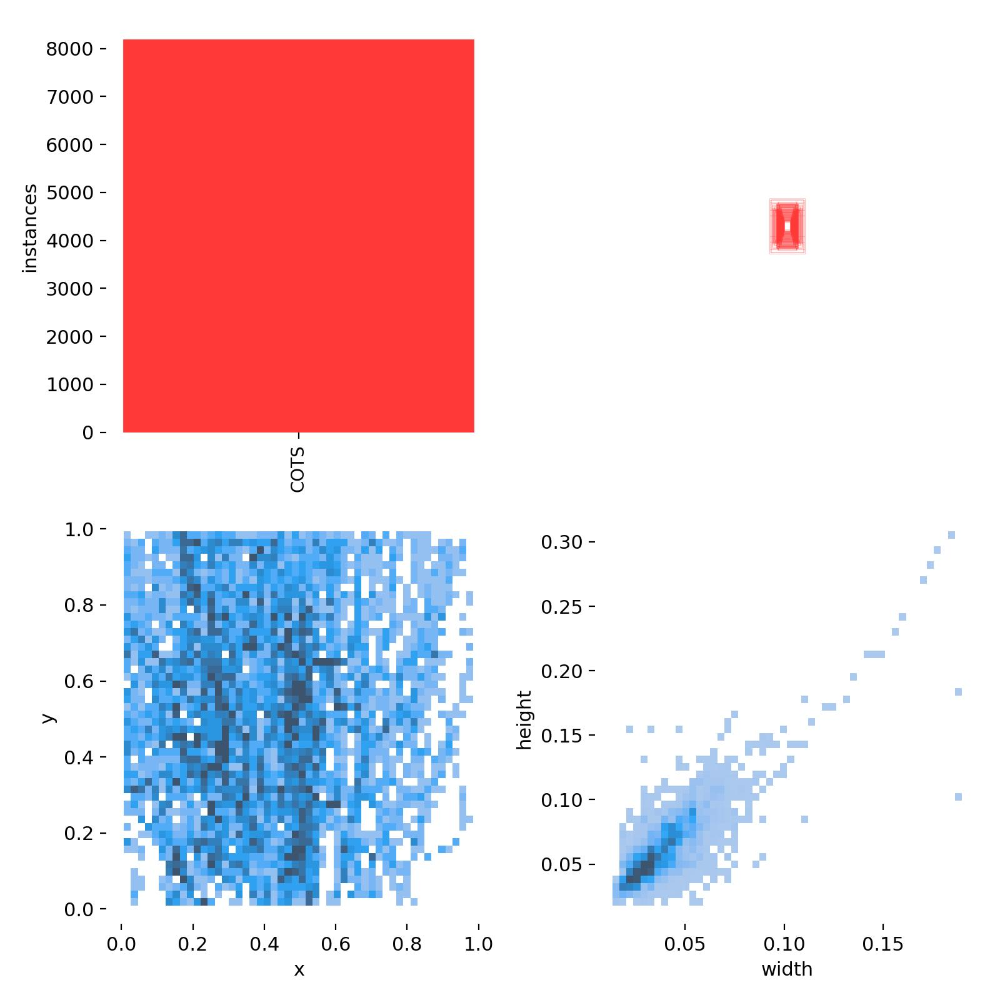

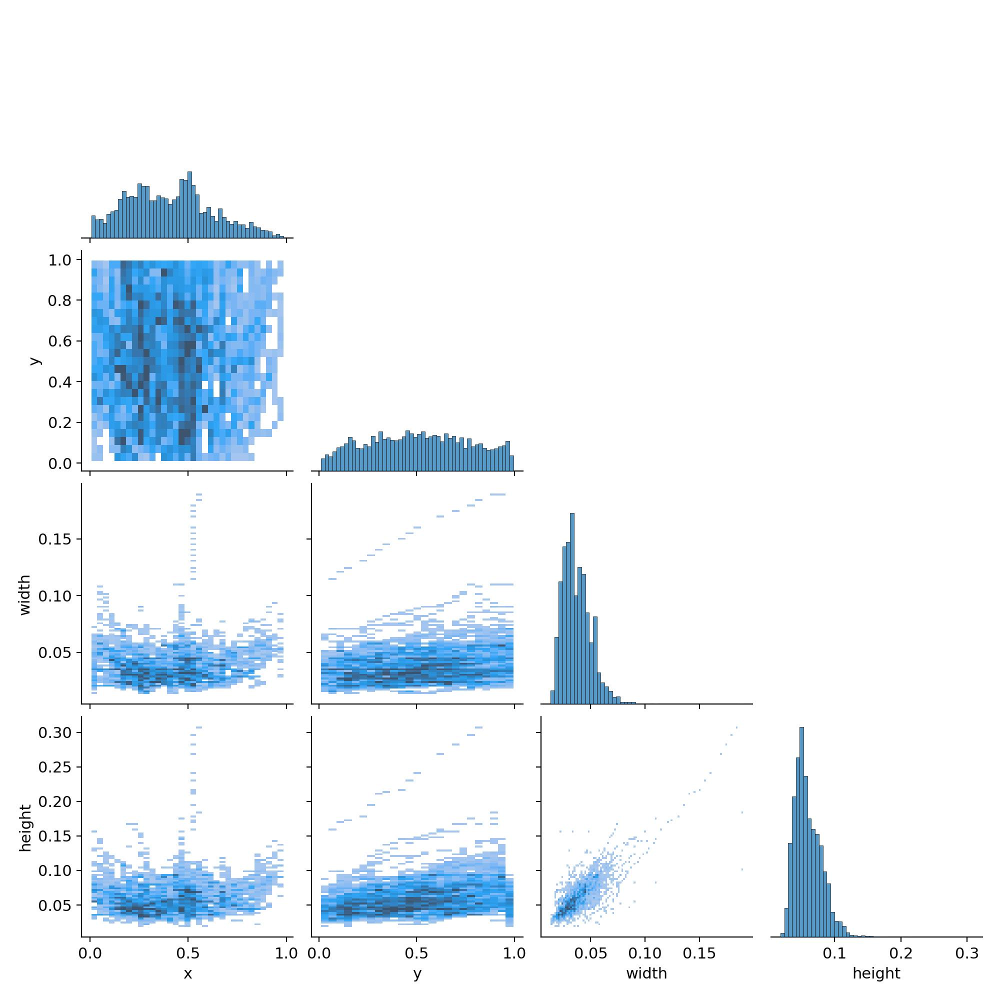

In [ ]:
results_dir = 'runs/train/exp2'

for cont in os.listdir(results_dir):
    if cont.endswith('.jpg'):
        display(Image(filename=os.path.join(results_dir, cont)))

In [ ]:
#Another option we had is to increase and adjust learning rate,optimizer parameters,and weight decay.
#Since 93% is efficient for the data and we will need larger hardware to run larger parameter adjusments and it will take longer GPU/CPU space.
hyper_yaml = f"""
lr0: 0.01
lrf: 0.2
box: 0.05
weight_decay: 0.0005
optimizer: 'Adam'
"""
with open(os.path.join(dataset_path, 'hyper_yaml'),'w')as f:
    f.write(dataset.yaml)